### **ЗАДАЧА 6 - OCR**

**Необходимо построить базовый алгоритм распознавания текста из документов.
Основным документом будет являться паспорт РФ.**

*   Для воспроизводства результатов ноутбука необходимо скачать zip-архив по ссылке: https://disk.yandex.ru/d/rl2OLdMks_w76A
Затем распаковать его в корневой каталог вашего Google Disk. Этот архив содержит синтетические данные для обучения модели, поэтому имеет большой размер. У меня были проблемы с Google Disk из-за этого, поэтому основная модель распознавания обучалась на Kaggle. 
*   Можно воспользоваться zip-архивом по ссылке: https://disk.yandex.ru/d/O0_DazFHGCXJYA . В этом случае обучение не воспроизводится, загружаются веса предобученной модели.




**0. Установим необходимые пакеты, импортируем базовые библиотеки, подключимся к Google Disk.**

In [ ]:
!pip install jellyfish

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 132 kB 6.0 MB/s 
  Created wheel for jellyfish: filename=jellyfish-0.9.0-cp38-cp38-linux_x86_64.whl size=70610 sha256=3d56003ba2877b558d379f49e628dfac3e2a55ed651de5181366fc376cb8b3ca
  Stored in directory: /root/.cache/pip/wheels/f1/c7/3c/4c83132de76359e3a429fd09c08995945ca96c5290a41651d3
Successfully built jellyfish


In [ ]:
!pip install easyocr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.9 MB 34.5 MB/s 
     |████████████████████████████████| 619 kB 62.7 MB/s 
     |████████████████████████████████| 47.6 MB 1.7 MB/s 
     |████████████████████████████████| 145 kB 76.8 MB/s 
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.6.0.66
    Uninstalling opencv-python-headless-4.6.0.66:
      Successfully uninstalled opencv-python-headless-4.6.0.66


In [ ]:
import pandas as pd
import numpy as np
import cv2
from os import listdir
from os.path import isfile, join, getsize
import json
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import ImageEnhance, ImageFilter, Image, ImageDraw
import PIL
from google.colab.patches import cv2_imshow
from math import ceil, floor
import pickle
import numpy as np
import pandas as pd
from skimage import io
from tqdm import tqdm, tqdm_notebook
from pathlib import Path
from multiprocessing.pool import ThreadPool
from sklearn.preprocessing import LabelEncoder
import torch.nn as nn
from google.colab import drive
from matplotlib import colors, pyplot as plt
%matplotlib inline
import torch
from torch.optim import AdamW
from torch.utils.data import DataLoader, SequentialSampler, RandomSampler, random_split, Dataset
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR
import torch.nn.functional as F
from jellyfish import jaro_distance
from IPython.display import clear_output
import random
from sklearn.model_selection import train_test_split

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.8/dist-packages/IPython/core/magics/pylab.py:159: UserWarning: pylab import has clobbered these variables: ['floor', 'ceil']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [ ]:
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [ ]:
PATH = '/content/gdrive/MyDrive/P-OCR/'

In [ ]:
TEST_PATH = PATH + 'DataForOCR/'

In [ ]:
test_files = [f for f in listdir(TEST_PATH) if isfile(join(TEST_PATH, f))]

**1. Подберем открытые библиотеки по распознаванию документов и проведем распознавания паспортов с указанной ссылки. Тестирование 4 вариантов (включая "чистый" tesseract, docTR и PaddleOCR) показало преимущество EasyOCR для рассматриваемых данных.**

In [ ]:
import easyocr
reader = easyocr.Reader(['ru','en'])

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.1% Complete

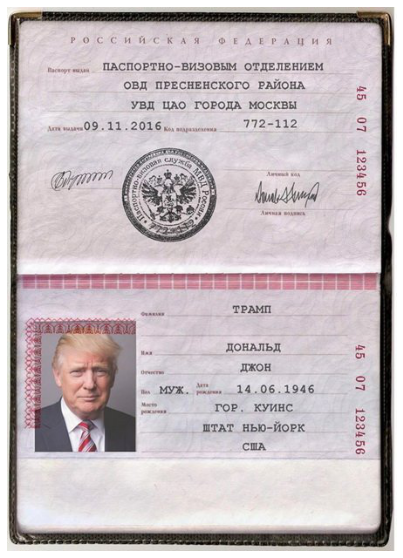

C с и и с к ; я
4 Е ₽
ПАСПОРТНО-визовым ОтДЕЛЕНИЕМ
овд
ПРЕСНЕНСКОГО
РАЙОНА
УВД ЦАО ГОРОДА МОСКВЫ
09.11.2016
аарачагыы
772-112
&
NwWlwn
ТРАМП
ДОНАЛЬД
Джон
Муж
14 . 06 . 1946
ГОР
КУИНС
ШТАТ
НЬЮ-ЙОРК
g
США


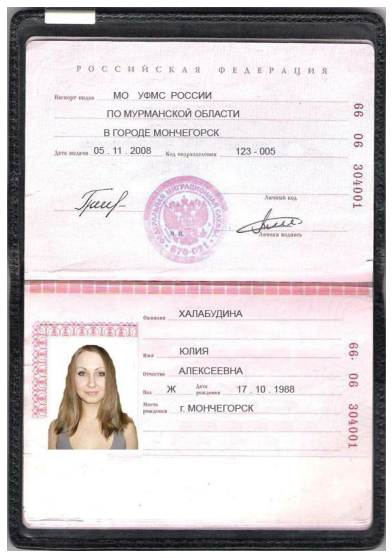

€ Ии € к
4 Я
Ф Е4 ₽ ₽ А ц
И %
мO
УФМС РОССИИ
ПО МУРМАНСКОЙ ОБЛАСТИ
В ГОРОДЕ МОНЧЕГОРСК
2008
123
005
7/
ё
ХАЛАБУДИНА
ЮЛИЯ
АЛЕКСЕЕВНА
8
10
1988
МОНЧЕГОРСК
ё


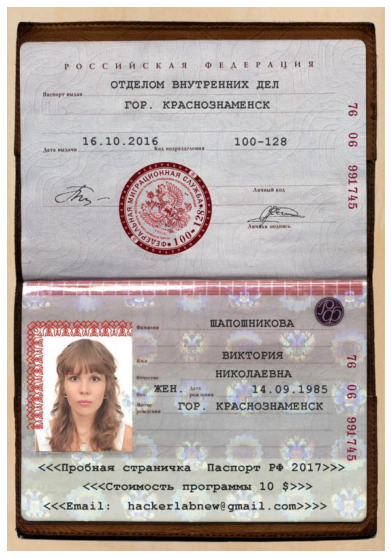

C и й € КLA
Ф 1 A Е ₽ А ц и Я
ОТДЕЛОМ ВНУТРЕННИХ ДЕЛ
яиа
ГОР
КРАСНОЗНАМЕНСК
@
16 . 10.2016
100-128
8
3
ШАПОШНИКОВА
ВИКТОРИЯ
НИКОЛАЕВНА
ЖЕН
14.09. 1985
ГОР
КРАСНОЗНАМЕНСК
$
5
<<<Пробная
страничка
Паспорт
РФ
2017>>>
<<<Стоимость
программы 10 $>>>
<<<Email:
hackerlabnew@ gmail
com>>> >
aavzg:


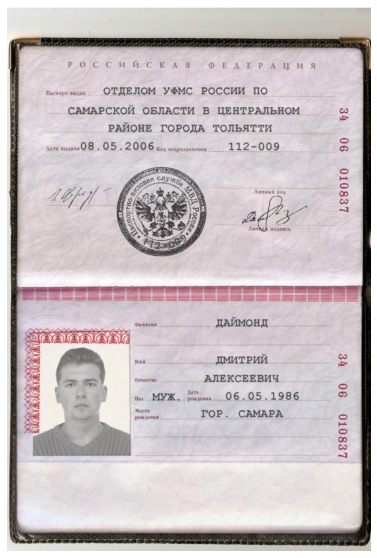

₽ 0 С С И й С K A Я
Ф Е 4 Е ₽ А Ц и Я
Ласпорт выдан
ОТДЕЛОМ
УФМС
РОССИИ
ПО
САМАРСКОЙ
ОБЛАСТИ
В
ЦЕНТРАЛЬНОМ
с?
РАЙОНЕ
ГОРОДА
тольятти
Дата выдачи
08
05.2006 Код подраздеАения
112-009
8
74114l
Дичннй Код
g
Мw
поуинев
Фаммлия
дАймОНД
1wл
ДМИТРИЙ
с
Отчсстно
АЛЕКСЕЕВИЧ
Ilол
МУЖ 
ротаения
06
05 . 1986
8
Меcтo
рождения
ГОР
САМАРА
ё
служба
(
€
ё
2
069


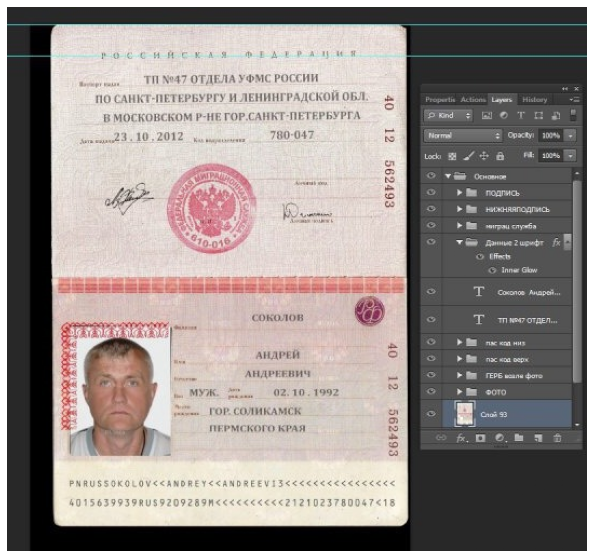

TI AN"47 ОТДЕЛА УФМС РОССИИ
ПО CАНКТ-ПЕТЕРБУРГУ H ЛЕНИНГРАДСКОЙ ОБЛ;
Fтpull
#могкОвском
~HE ГОР САНКТ ПЕТЕРБУРГА
рем
2012
T8П-047
Gaaat
2 +
2
Талгчс
м~ниаша
хэбры аy 53
FUзatoin
Hpn5
Cтлазъыгер
сОкаЛОТ
шкшилва
АНДРЕИ
АНДРЕЕНИЧ
ПеРЕ .рл
музк -
пэтп
1 957
FOР СОЛИкАМСК
Слuъчs
пеРыскоГижкРАЛ
8
Fa
УHU 5 594 4
П У;;AWв
E1 <;ayDRBUi.
4015 639 93 9#U 5 9 20 9289 М < << < <<<<<<2121[2378 D! ,7 <16


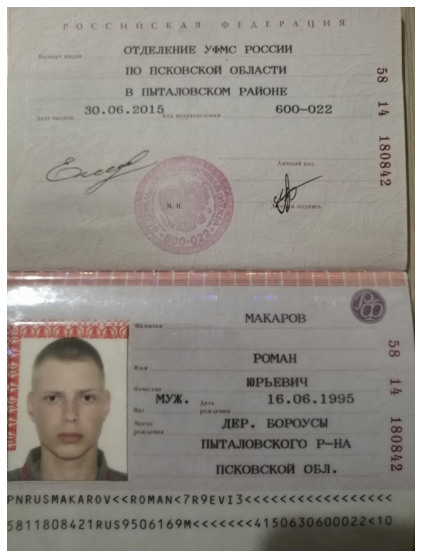

и
К4
F A 1 ₽A ци
ОТДЕЛЕНИЕ
УФМС
РОССИИ
Пкар,
шмин
ПО
ПСКОВСКОЙ
ОБЛАСТИ
Ол
0
B
ПЫТАЛОВСКОМ
РАИОНЕ
30 . 06 . 2015
600-022
F
(е
3
МАКАРОВ
с
РОМАН
ЮРЬЕВИЧ
F
МУЖ .
 |
16.06.1995
м;т9
ДЕР
БОРОУСЫ
Imдэли н
ПЫТАЛОВСКОГО
РHA
:
ПСКОВСКОЙ
ОБЛ
PNR U SMAKAROV < <ROMAN<7R9EVIЗ<<<<<<<<<<<<<<<<<
5811808421RUS 9506169М<<<<<<<4150630600022<10
"6-02


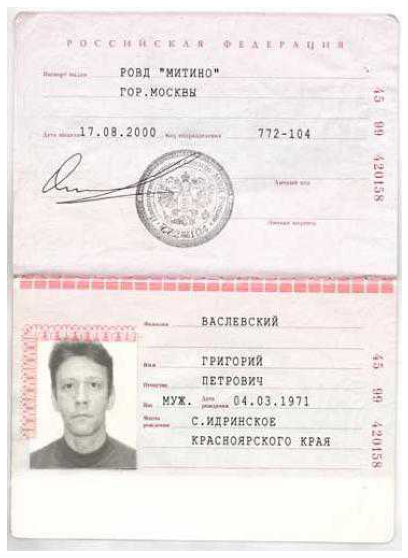

РОвД
МитяНа"
ГОР . УОСkЕH
J1
2000
772-104
ВАСЛЕ ВСКИЯ
FPИГОPJ#
ПЕтРОВиц
нух
74.01+1971
С;"ДРИнСкОЕ
КРАСНОЯРСТОТО
#Ряя


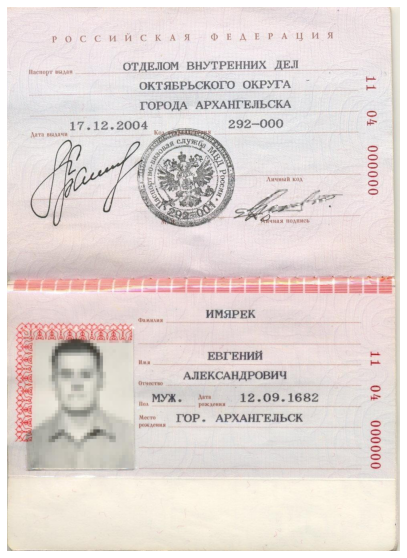

Р0 С С И Й € K А Я
Ф ЕД Е Р A
Щи Я
ОТДЕЛОМ
ВНУТРЕННИХ
ДЕЛ
Паспорт выдан
ОКТЯБРЬСКОГО
ОКРУГА
н
ГОРОДА
АРХАНГЕЛЬСКА
17
12.2004
292-000
2
Цата выдачи
(Yл
8
Аичныйскод
3
тная
нодписъ
ИМЯРЕК
Фжмихня
ЕВГЕНИЙ
н
АЛЕКСАНДРОВИЧ
Отчество
МУЖ
Дата
12.09
1682
2
Iол
рожАения
Mесто
ГОР
АРХАНГЕЛЬСК
рождения
3
сЛчэба
овая


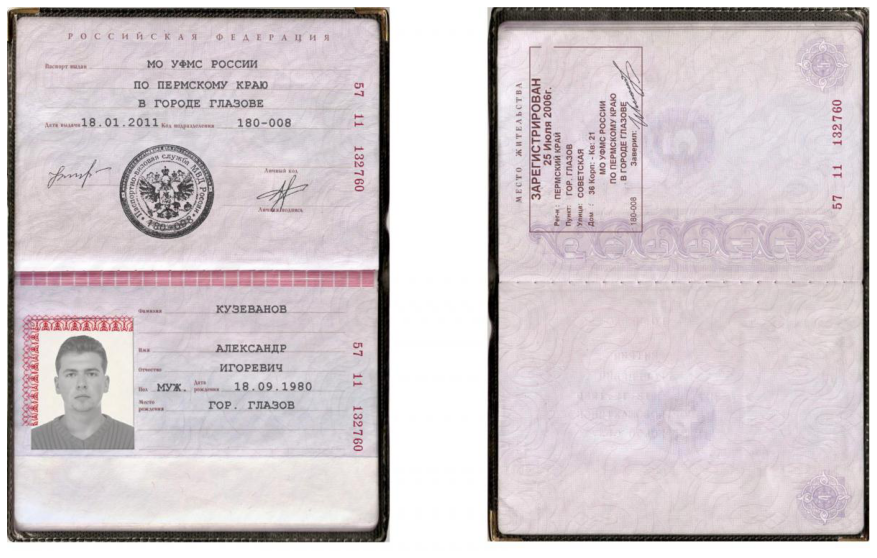

С С и Й СкА
Ф Е Д БИTA ц
И Я
MO УФМС РОССИИ
по
ПЕРМСКОМУ
КРАЮ
9
ГОРОДЕ
ГЛАЗОВЕ
8
g
Авта пмяч ] 8 . 01.2011 ка
180-008
F
:
3в
:
1
8
2
8
g
:
!
1
2
₽
1
g
8
ё
#2
я
5
EF a
8
КУЗЕВАНОВ
АЛЕКСАНДР
с
ИГОРЕВИЧ
МуЖ
18 . 09 .1980
F
ГОР
глАзОВ
g


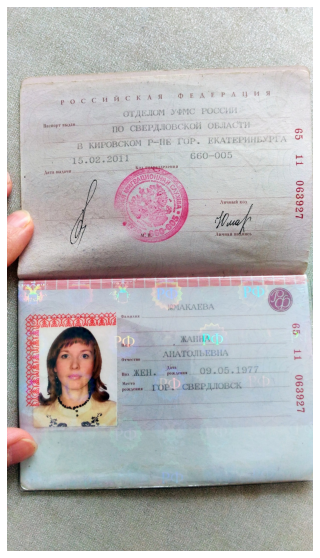

Я
Ф 
f 4 € ₽ ^ Ц и Я
₽ 0 с € и й € К А
ЛIДЕлоМ
УФРIС
Расони
Ласпорт зыда
НO
СВЕРДЛОВСКОЙ
ОБАСтЙ
P~HE
ГOР =
ЕКАТЕРИНЬУРМ
8
5
КИРовскОМ
660
005
15.02.2O11
+
#зделения
Дaта вадачн
Анчый код
:
'(мо
Аичная иоfmнсь
# `
РФ
{AKAЕВА
Фaжлпния
&
РФ
#АНН
НРФ
АНАТОЛЬЕВНА
+
Отчество
Ioл
ЖЕH 
ДожАения
09.05.19z7
Mecто
Ф
 `
рождения
FOF
СВЕРДловСК
g
P4p


In [ ]:
for item in test_files:
  plt.figure(figsize=(16, 10))
  img = mpimg.imread(join(TEST_PATH, item))
  plt.imshow(img)
  plt.axis('off')
  plt.show()
  parsed = reader.readtext(join(TEST_PATH, item), detail = 0)
  print('\n'.join(parsed))

Качество распознавания среднее, задача выделени ФИО осложнена разным количеством распознанных полей для разных сканов.

**2. Подберем API c помощью которых можно провести распознавание, проведем распознавание. С учетом бесплатности и комментариев в таблице выбран OCR.space.**

In [ ]:
# Функция доступа по API к https://ocr.space/ взята отсюда:
# https://github.com/Zaargh/ocr.space_code_example

import requests

def ocr_space_file(filename, overlay=False, api_key='K82833495188957', language='rus', OCREngine=1):
    """ OCR.space API request with local file.
        Python3.5 - not tested on 2.7
    :param filename: Your file path & name.
    :param overlay: Is OCR.space overlay required in your response.
                    Defaults to False.
    :param api_key: OCR.space API key.
                    Defaults to 'helloworld'.
    :param language: Language code to be used in OCR.
                    List of available language codes can be found on https://ocr.space/OCRAPI
                    Defaults to 'en'.
    :return: Result in JSON format.
    """

    payload = {'isOverlayRequired': overlay,
               'apikey': api_key,
               'language': language,
               'OCREngine': OCREngine
               }
    with open(filename, 'rb') as f:
        r = requests.post('https://api.ocr.space/parse/image',
                          files={filename: f},
                          data=payload,
                          )
    return r.content.decode()

Подготовим файлы (предобработаем с учетом ограничения размеров).

In [ ]:
!mkdir 'api_test'

In [ ]:
API_PATH = '/content/api_test'

In [ ]:
for item in test_files:
  fn = join(TEST_PATH, item)
  im = Image.open(fn)
  if getsize(fn) > 1000000:
    final_wide = 1200
    r = float(final_wide) / im.width
    dim = (final_wide, int(im.height * r))
    im = im.resize(dim)
  im.save(join(API_PATH, item))

In [ ]:
api_files = [join(API_PATH, f) for f in listdir(API_PATH) if isfile(join(API_PATH, f))]

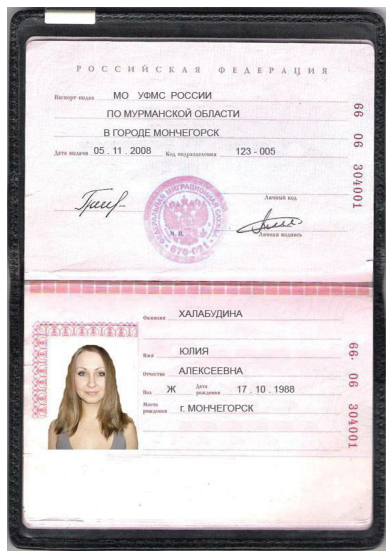

российск Л Я ф Е д
Е РА Ц ИЯ
мо УФМС россии
ПО МУРМАнскои ОБЛАСТИ
з городе мончегоррк
05 11 . 2008
123 - 005
ХАЛАБУДИНА
юлия
АЛЕКСЕЕВНА
17 1988
Г МОНЧЕГОРСК



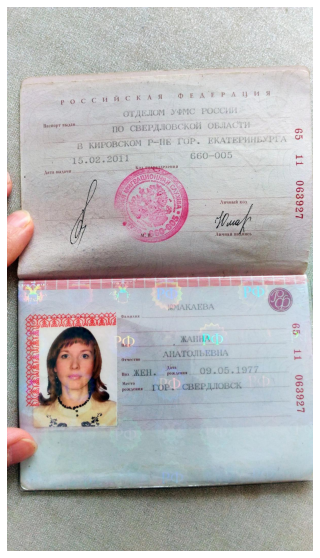

РОССИЙСКА Я Ф ЕД'ЕРЛЦИ
УФМС
Паспорт выдан-.——
ПО ОЬ.ЛАСАИ
я
В кировском Р—НЕ ГОР. д
15202 2011
Дата выдачи
елени.я
660-005
Аичный код
и пись
ХМАКАЕГЗА
Фа.иилия
ЖАННА
АНАТОЛЬЕВНА
Отчество
Дата
-09.05.1977
рождения
Место
- лор . -СВЕГДЛИВСК



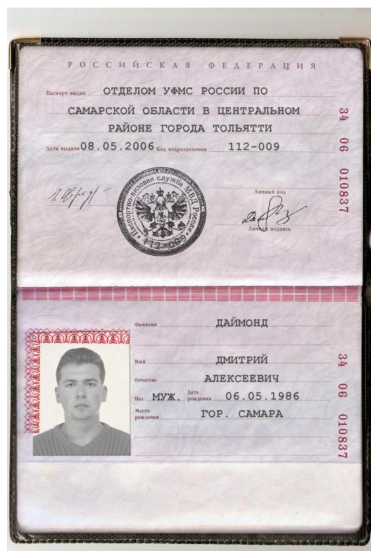

ц
Паспорт выдан
СС ТЛ Й С КАЯ Ф ЕДЕ РА
ОТДЕЛОМ УФМС РОССИИ ПО
и
я
САМАРСКОЙ ОБЛАСТИ В ЦЕНТРАЛЬНОМ
РАЙОНЕ ГОРОДА ТОЛЬЯТТИ
08.05.2006
Дата выдачи
Код подразделения
с.лу„г
Фамилия
Имя
112-009
Личный код
Лич
ДАймонд
ДМИТРИЙ
подпись
АЛЕКСЕЕВИЧ
МУЖ
Место
рождения
дата
рождения
06.05.1986
ГОР . СААРА



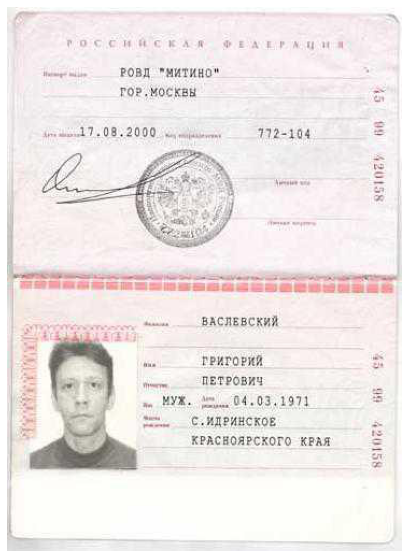

разд «МИТИНО“
гор . Уосквн
Григо?йд
ПЕТРОВИЧ
Ууж,
04.93„19?)
е. идринскаг
КРАСНОЯРСКОГО КИЯ



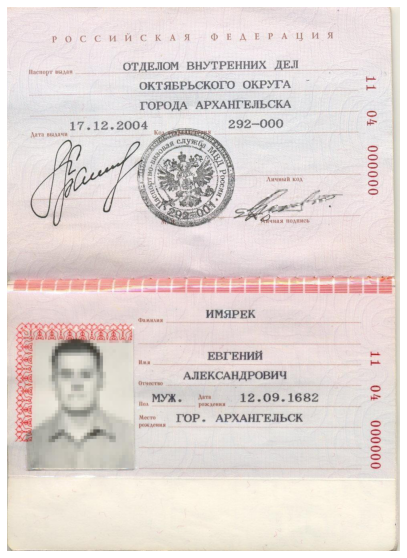

P ОС
Паспорт выдан
с
ИЙ СКАЯМЬЕДЕРАЦ
ОТДЕЛОМ ВНУТРЕННИХ ДЕЛ
ОКТЯБРЬСКОГО ОКРУГА
ГОРОДА АРХАНГЕЛЬСКА
и
я
17.12.2004
Ко
Дата выдачи
q.» СЛУЖ
292-000
Личный код
чная нодпись
ИМЯРЕК
Фам илия
ЕВГЕНИЙ
Имя
АЛЕКСАНДРОВИЧ
еетво
МУЖ • Дата
рождения .
12.09.1682
Место
рождения
ГОР. АРХАНГЕЛЬСК



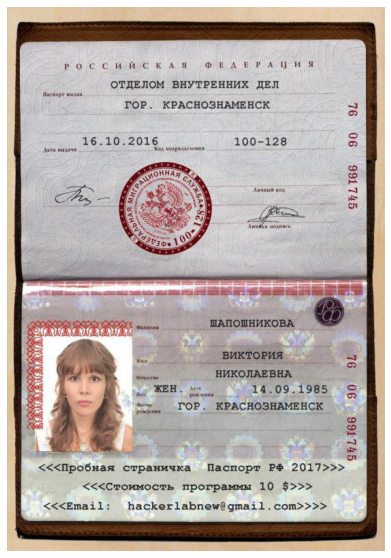

РОССИ й к: к А Я Ф Е д РА ция
ОТДЕЛОМ ВНУТРЕННИХ ДЕЛ
гор . КРАСНОЗНАМЕНСК
16.10.2016
ЖЕН.
100-128
ШАПОШНИКОВА
виктория
НИКОЛАЕВНА
14.09.1985
КРАСНОЗНАМЕНСК
страничка Паспорт РФ 2
программы 10
1 : hackerlabnewE gmai1.



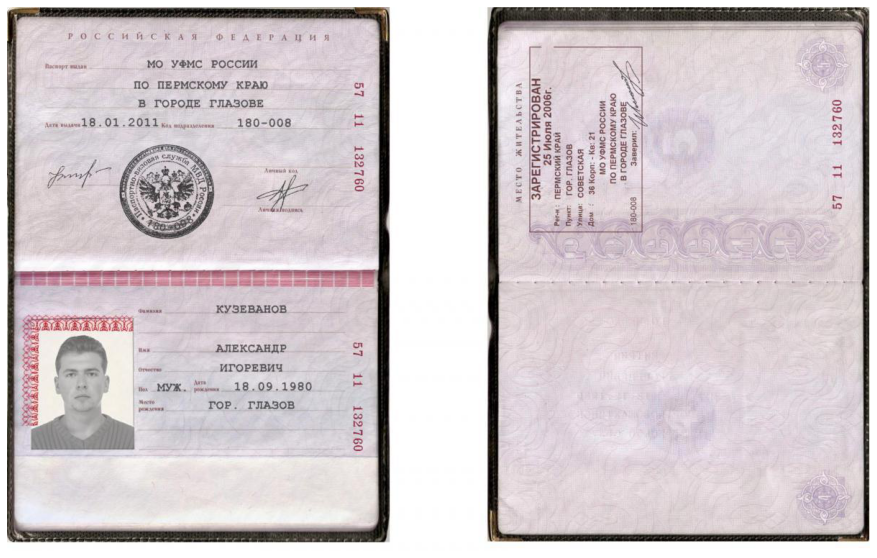

россий СКА я Ф Е д ЕРАция
мо УФМС россии
ПО ПЕРМСКОМУ КРАЮ
В ГОРОДЕ ГЛАЗОВЕ
. 2011
180-008
КУЗЕ ВАНОВ
—АЛЕКСАНДР
ИГОРЕВИЧ
_lB.09
гор. ГЛАЗОВ



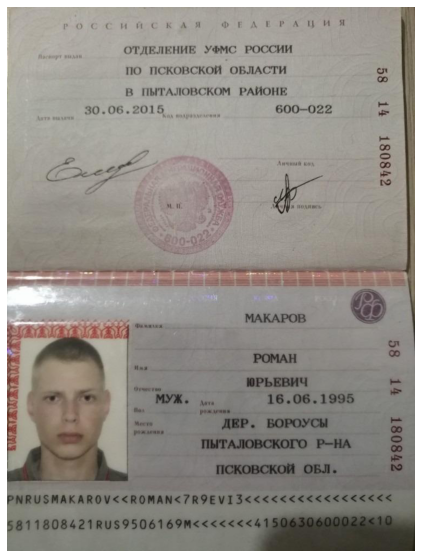

зо
е КАЯ Ф А Ц ИЯ
ОТДЕЛЕНИЕ УФМС РОССИИ
ПО ПСКОВСКОЙ ОБЛАСТИ
В ПЫТАЛОВСКОМ РАЙОНЕ
600—022
Квт
МАКАРОВ
ЮРЬЕВИЧ
16.06.1995
ДЕР. ВОРОУСЫ
ПЫТМоВсКОГО Р—НА
псковской оьл.
581 1808421 50630600022<10



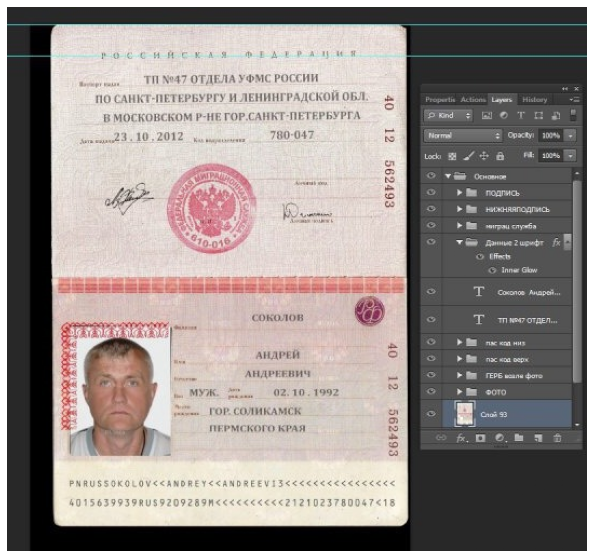

тп ОТДЕЛА УФмс россу
по САНКТ-ПЕТЕРБУРГУ И ленинградской огьЛ,
в московском р-не горглнк-т „петер
, 2012
780-047
А н„.аркЛ3
АНД
02.
'ог•. со.лик_Амгк
пнрмг.кого КРАЯ



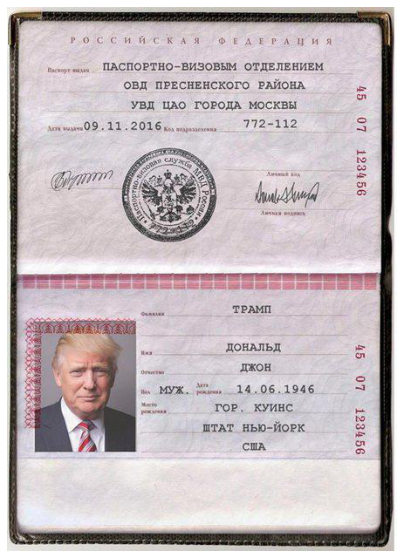

российск А я ф гд Ердция
ПАСПОРТНО-визовым ОТДЕЛЕНИЕМ
ОВД ПРЕСНЕНСКОГО РАЙОНА
увд ЦА0 ГОРОДА МОСКВЫ
772-112
ТРАМП
ДОНАЛЬД
джон
ОБ .1946
гор. куинс
„ ШТАТ _ нью-йорк_



In [ ]:
for item in api_files:
  pars_file = ocr_space_file(filename=item)
  parsed = json.loads(pars_file)
  plt.figure(figsize=(16, 10))
  img = mpimg.imread(item)
  plt.imshow(img)
  plt.axis('off')
  plt.show()
  print(parsed["ParsedResults"][0]["ParsedText"])

Качество хуже, чем у EasyOCR.

**3. Обучим собственный алгоритм (pytorch), который распознает ФИО с паспорта (не пользуясь готовыми библиотеками OCR, но пользуясь открытыми данными по распознаванию текста).**

С учетом того, что датасета для обучения модели, извлекающей структуру документа, у нас нет, применим "костыль". Попробуем находить фото лица на скане (с помощью каскада Хаара из OpenCV) и относительно него вырезать прямоугольник, содержащий ФИО. Потом на этом прямоугольнике найдем текстовые блоки (с помощью предобученной модели EAST из OpenCV). Текстовые блоки переведём контрастно в черно-белое изображение.Возьмем достаточно большие блоки, чтобы избавиться от фрагментов цифр. Алгоритмически уберем лишний белый фон.

In [ ]:
# инициализируем распознаватель лиц (каскад Хаара по умолчанию)
hcpath = PATH + 'haar-cascade-files/haarcascade_frontalface_alt.xml'
face_cascade = cv2.CascadeClassifier(hcpath)
face_cascade.empty()

False

In [ ]:
#Модифицируем код из открытых источников, чтобы он сохранял порядок обнаруженных текстовых блоков
def non_max_suppression(boxes, probs=None, overlapThresh=0.3):

  # if there are no boxes, return an empty list
  if len(boxes) == 0:
    return []
  # if the bounding boxes are integers, convert them to floats -- this
  # is important since we'll be doing a bunch of divisions
  if boxes.dtype.kind == "i":
    boxes = boxes.astype("float")
  # initialize the list of picked indexes
  pick = []
  # grab the coordinates of the bounding boxes
  x1 = boxes[:, 0]
  y1 = boxes[:, 1]
  x2 = boxes[:, 2]
  y2 = boxes[:, 3]
  # compute the area of the bounding boxes and grab the indexes to sort
  # (in the case that no probabilities are provided, simply sort on the
  # bottom-left y-coordinate)
  area = (x2 - x1 + 1) * (y2 - y1 + 1)
  idxs = y2
  # if probabilities are provided, sort on them instead
  if probs is not None:
    idxs = probs
  # sort the indexes
  idxs = np.argsort(idxs)
  # keep looping while some indexes still remain in the indexes list
  while len(idxs) > 0:
    # grab the last index in the indexes list and add the index value
    # to the list of picked indexes
    last = len(idxs) - 1
    i = idxs[last]
    pick.append(i)
    # find the largest (x, y) coordinates for the start of the bounding
    # box and the smallest (x, y) coordinates for the end of the bounding
    # box
    xx1 = np.maximum(x1[i], x1[idxs[:last]])
    yy1 = np.maximum(y1[i], y1[idxs[:last]])
    xx2 = np.minimum(x2[i], x2[idxs[:last]])
    yy2 = np.minimum(y2[i], y2[idxs[:last]])
    # compute the width and height of the bounding box
    w = np.maximum(0, xx2 - xx1 + 1)
    h = np.maximum(0, yy2 - yy1 + 1)
    # compute the ratio of overlap
    overlap = (w * h) / area[idxs[:last]]
    # delete all indexes from the index list that have overlap greater
    # than the provided overlap threshold
    idxs = np.delete(idxs, 
    np.concatenate(([last],np.where(overlap > overlapThresh)[0])))
  # return only the bounding boxes that were picked
  pick.sort()
  return boxes[pick].astype("int")

In [ ]:
net = cv2.dnn.readNet('/content/gdrive/MyDrive/P-OCR/frozen_east_text_detection.pb')
ims = []
for item in test_files:
  fn = join(TEST_PATH, item)

  image = cv2.imread(fn)
  image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  # обнаружение всех лиц на изображении
  faces = face_cascade.detectMultiScale(image=image_gray)
  faces_sorted = list(faces)
  faces_sorted.sort(key=lambda x: x[2] * x[3])
  # для всех обнаруженных лиц рисуем синий квадрат
  x, y, width, height = faces_sorted[-1]


  img = image[y - int(1.2 * height): y + int(0.58 * height), x + int(2.1 * width):x + int(4.7 * width), :]

  final_h = 217
  r = float(final_h) / img.shape[0]
  dim = (int(img.shape[1] * r), final_h)
  img = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
  new_rec = (np.ones((320, 320, 3)) * 255).astype(np.uint8)
  new_rec[:217, :img.shape[1]] = img
  #picts.append(new_rec)

  orig = new_rec.copy()

  (H, W) = new_rec.shape[:2]

  # set the new width and height and then determine the ratio in change
  # for both the width and height
  (newW, newH) = (320, 320)
  rW = W / float(newW)
  rH = H / float(newH)

  # resize the image and grab the new image dimensions
  image = cv2.resize(new_rec, (newW, newH))
  (H, W) = image.shape[:2]

  # define the two output layer names for the EAST detector model that
  # we are interested -- the first is the output probabilities and the
  # second can be used to derive the bounding box coordinates of text
  layerNames = [
      "feature_fusion/Conv_7/Sigmoid",
      "feature_fusion/concat_3"]

  # load the pre-trained EAST text detector
  print("[INFO] loading EAST text detector...")
  

  # construct a blob from the image and then perform a forward pass of
  # the model to obtain the two output layer sets
  blob = cv2.dnn.blobFromImage(image, 1.0, (W, H),(123.68, 116.78, 103.94), swapRB=True, crop=False)
  net.setInput(blob)
  (scores, geometry) = net.forward(layerNames)

  # grab the number of rows and columns from the scores volume, then
  # initialize our set of bounding box rectangles and corresponding
  # confidence scores
  (numRows, numCols) = scores.shape[2:4]
  rects = []
  confidences = []

  # loop over the number of rows
  for y in range(0, numRows):
      # extract the scores (probabilities), followed by the geometrical
      # data used to derive potential bounding box coordinates that
      # surround text
      scoresData = scores[0, 0, y]
      xData0 = geometry[0, 0, y]
      xData1 = geometry[0, 1, y]
      xData2 = geometry[0, 2, y]
      xData3 = geometry[0, 3, y]
      anglesData = geometry[0, 4, y]
      
      for x in range(0, numCols):
          # ignore probability values below 0.75
          if scoresData[x] < 0.75:
              continue
          
          # compute the offset factor as our resulting feature maps will
          # be 4x smaller than the input image
          (offsetX, offsetY) = (x * 4.0, y * 4.0)
          
          # extract the rotation angle for the prediction and then
          # compute the sin and cosine
          angle = anglesData[x]
          cos = np.cos(angle)
          sin = np.sin(angle)
          
          # use the geometry volume to derive the width and height of
          # the bounding box
          h = xData0[x] + xData2[x]
          w = xData1[x] + xData3[x]
          
          # compute both the starting and ending (x, y)-coordinates for
          # the text prediction bounding box
          endX = int(offsetX + (cos * xData1[x]) + (sin * xData2[x]))
          endY = int(offsetY - (sin * xData1[x]) + (cos * xData2[x]))
          startX = int(endX - w)
          startY = int(endY - h)
          
          # add the bounding box coordinates and probability score to
          # our respective lists
          rects.append((startX, startY, endX, endY))
          confidences.append(scoresData[x])

  # apply non-maxima suppression to suppress weak, overlapping bounding
  # boxes
  boxes = non_max_suppression(np.array(rects), probs=confidences)

  # loop over the bounding boxes
  # take a copy o the original image
  image2 = orig.copy()
  k = 0
  for i, (startX, startY, endX, endY) in enumerate(boxes):
    if confidences[i] > 0.0:
      startX = int(startX * rW)
      startY = int(startY * rH)
      endX = int(endX * rW)
      endY = int(endY * rH)
      cropped = image2[startY-5:endY+10, startX-5:endX+5]
      if (cropped.shape[0] > 0) and (cropped.shape[1] > 50):
        if k < 3:
          gray = cv2.cvtColor(cropped, cv2.COLOR_BGR2GRAY)
          blur = cv2.GaussianBlur(gray, (3,3), 0)
          img = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]

          jh = 0
          jl = 0
          j = 0
          while (np.mean(img[j, :]) > 200) and (j < img.shape[0]):
            j += 1
          jh = j
          jl = j
          while (np.mean(img[j, :]) < 200) and (j < img.shape[0]):
            j += 1
            jl += 1
          hl = jl - jh


          img2 = img[jh - floor(0.25 * hl):jl + floor(0.25 * hl), :]

          img3 = []
          for j in range(img2.shape[1]):
            if np.mean(img2[:, j]) < 255:
              img3.append(list(img2[:, j]))
          img3 = np.array(img3, dtype='uint8').T
          cv2_imshow(img3)
          k += 1
          cv2.imwrite(join('/content/gdrive/MyDrive/P-OCR/sample/', str(k) + '_' + item), img3)
          ims.append(img3)

[INFO] loading EAST text detector...


[INFO] loading EAST text detector...


[INFO] loading EAST text detector...


[INFO] loading EAST text detector...


[INFO] loading EAST text detector...


[INFO] loading EAST text detector...


[INFO] loading EAST text detector...


[INFO] loading EAST text detector...


[INFO] loading EAST text detector...


[INFO] loading EAST text detector...


Обучим для распознования выделенных ФИО упрощенную версию CRNN. Данные для обучения синтезировны на основе трёх больших текстов.

In [ ]:
#зафиксируем рандомы
random.seed(42)
torch.manual_seed(42)
np.random.seed(42)

In [ ]:
torch.autograd.set_detect_anomaly(True)

In [ ]:
train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
  DEVICE = torch.device('cpu')
  print('CUDA is not available.  Training on CPU ...')
else:
  DEVICE = torch.device('cuda')
  print('CUDA is available!  Training on GPU ...')

CUDA is available!  Training on GPU ...


In [ ]:
RESCALE_SIZE = 32 
BATCH_SIZE = 32
WS_SYMBOL = '^'
SYMBOL_SET = WS_SYMBOL + 'АБВГДЕЁЖЗИЙКЛМНОПРСТУФХЦЧШЩЪЫЬЭЮЯ'
WS_CODE = SYMBOL_SET.index(WS_SYMBOL)
N_OUT = len(SYMBOL_SET)
data_path = PATH + 'train3/'

In [ ]:
#загрузим датафрейм с метками и ссылками на изображения
df = pd.read_csv(PATH + 'train_data3.csv', index_col=0)
data_ids = list(df.index)

In [ ]:
#разделим датасет на тренировочную, валидачционную и тестовую части
train_ids, val_ids = train_test_split(data_ids, test_size=0.20)
val_ids, test_ids = train_test_split(val_ids, test_size=0.50)

In [ ]:
# определим ряд функций, переводящих символы(буквы) в код(индекс) и обратно
def text_to_numbers(text: str) -> np.array:
    return np.array([SYMBOL_SET.index(c) for c in text], dtype=np.int64)

def numbers_to_text(arr) -> str:
    return ''.join([SYMBOL_SET[code] for code in arr])

def decode_sequence(seq):
    out = []
            
    current_code = None
    for i, v in enumerate(seq):
        if v == current_code:            
            continue

        current_code = v
        if v == WS_CODE:
            current_code = None
            continue
                    
        out.append(v)

    return ''.join(numbers_to_text(out))

def decode_batch(input):
    """
    input in shape: [B, seq, feature]
    """

    # From the last dimension, choose the indices with highest
    # probabilities. These indices point to SYMBOL_SET
    maxed = torch.argmax(input.cpu(), -1).numpy()
    # [B, seq] : each value is an index to SYMBOL_SET
    return [decode_sequence(seq) for seq in maxed]

In [ ]:
# определим класс датасетов
class MyDataset(Dataset):
    def __init__(self, ids=train_ids, df = df, data_path=data_path):
        self.data_path = data_path
        self.sample_ids = ids
        self.df = df
    
    def __len__(self):
        return len(self.sample_ids)
    
    def __getitem__(self, i):
        sample_path = self.data_path + self.df.loc[self.sample_ids[i]]['link']
        img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)
        r = float(RESCALE_SIZE) / img.shape[0]
        dim = (int(img.shape[1] * r), RESCALE_SIZE)
        img = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
        label = self.df.loc[self.sample_ids[i]]['label']        
        return (img, text_to_numbers(label), len(label)) 

In [ ]:
# создадим необходимые датасеты
train_dataset = MyDataset(train_ids)
val_dataset = MyDataset(val_ids)
test_dataset = MyDataset(test_ids)

In [ ]:
# функция для паддинга в батчах
def collate_fn(batch):
    max_len = max([row[0].shape[1] for row in batch]) # 256
    max_labs = max(len(row[1]) for row in batch) 
    input_padded = np.ones((len(batch), RESCALE_SIZE, max_len), dtype='uint8') * 255
    labels = np.zeros((len(batch), max_labs))
    lengths = np.zeros((len(batch)))
    for idx, row in enumerate(batch):
        input_padded[idx, :, : row[0].shape[1]] = row[0]
        labels[idx, :len(row[1])] = row[1]
        lengths[idx] = row[2]

    return (input_padded, labels, lengths)

In [ ]:
# загрузчики
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, shuffle=False)

In [ ]:
# архитектура CRNN
class CRNN(nn.Module):

    def __init__(self, nclass, nh):
        super(CRNN, self).__init__()
        
        # 1x32x128
        self.conv1 = nn.Conv2d(1, 64, 3, 1, 1)
        self.relu1 = nn.ReLU()
        self.pool1 = nn.MaxPool2d(2, 2)

        # 64x16x64
        self.conv2 = nn.Conv2d(64, 128, 3, 1, 1)
        self.relu2 = nn.ReLU()
        self.pool2 = nn.MaxPool2d(4, 2)

        # 128x8x32
        self.conv3_1 = nn.Conv2d(128, 256, 3, 1, 1)
        self.bn3 = nn.BatchNorm2d(256)
        self.relu3_1 = nn.ReLU(True)
        self.pool3 = nn.MaxPool2d(4, 4)

        # 256x1x16
        self.rnn = nn.LSTM(256, nh, bidirectional=True)
        self.embedding = nn.Linear(nh * 2, nclass)

    def forward(self, input):
        x = input.unsqueeze(1)
        x = self.pool1(self.relu1(self.conv1(x)))
        x = self.pool2(self.relu2(self.conv2(x)))
        conv = self.pool3(self.relu3_1(self.bn3(self.conv3_1(x))))
        # print(conv.size())

        b, c, h, w = conv.size()
        assert h == 1, "the height of conv must be 1"
        conv = conv.squeeze(2)
        conv = conv.permute(2, 0, 1)  # [w, b, c]

        # rnn features
        recurrent, _ = self.rnn(conv)
        T, b, h = recurrent.size()
        t_rec = recurrent.view(T * b, h)

        output = self.embedding(t_rec)  # [T * b, nOut]
        output = output.view(T, b, -1)

        return output

In [ ]:
# инициализируем сеть
model = CRNN(N_OUT, 1024)
model.to(DEVICE)

CRNN(
  (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu1): ReLU()
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu2): ReLU()
  (pool2): MaxPool2d(kernel_size=4, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3_1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu3_1): ReLU(inplace=True)
  (pool3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (rnn): LSTM(256, 1024, bidirectional=True)
  (embedding): Linear(in_features=2048, out_features=34, bias=True)
)

In [ ]:
# определим фенкцию для расчета расстояния Джаро суммарно на батче предсказаний
def metric(preds, labels):
  m = 0
  out = decode_batch(preds.permute(1, 0, 2))
  targ = []
  lab_n = labels.detach().cpu().numpy()
  for i in range(labels.shape[0]):
    targ.append(numbers_to_text(lab_n[i]))
  assert len(targ) == len(out)
  for i in range(len(out)):
    m += jaro_distance(out[i], targ[i])
  return m

In [ ]:
# в качестве лосс-фунции возьмем CTCLoss. CTCLoss суммирует вероятность возможного выравнивания предсказанной последовательности для ее совпадения с таргетом.
criterion = nn.CTCLoss(blank=0, reduction='sum', zero_infinity=True)

In [ ]:
# Определим функции обучения, валидации и тестирования
def fit_epoch(model, train_loader, criterion, optimizer):
    model.train()
    running_loss = 0.0
    running_metric = 0
    processed_data = 0
    mean_loss = []
  
    for batch in train_loader:
        inputs = torch.Tensor(batch[0]).to(DEVICE)
        labels = torch.LongTensor(batch[1]).to(DEVICE)
        lengths = torch.LongTensor(batch[2]).to(DEVICE)

        optimizer.zero_grad()

        preds = model(inputs)
        #print(F.log_softmax(preds, dim=-1).shape, inputs.shape, labels.shape, lengths.shape)
        loss = criterion(F.log_softmax(preds, dim=-1),
          labels,
          torch.LongTensor([preds.shape[0]] * preds.shape[1]),
          lengths)
        loss.backward()
        if max_grad_norm is not None:
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)
        optimizer.step()
        #preds = torch.argmax(outputs, 1)
        mean_loss.append(loss.item())
        running_loss += loss.item() #* inputs.size(0)
        running_metric += metric(preds, labels)
        processed_data += inputs.size(0)
        #plt.figure(figsize=(10, 5))
        #clear_output(True)
        #plt.plot(mean_loss, label="train_batch_loss")
        #plt.ylim([0, 10])
        #plt.legend(loc='best')
        #plt.show()
              
    train_loss = running_loss / processed_data
    train_jaro = running_metric / processed_data
    return train_loss, train_jaro

In [ ]:
def eval_epoch(model, val_loader, criterion):
    model.eval()
    running_loss = 0.0
    running_metric = 0
    processed_size = 0

    for batch in val_loader:
        inputs = torch.Tensor(batch[0]).to(DEVICE)
        labels = torch.LongTensor(batch[1]).to(DEVICE)
        lengths = torch.LongTensor(batch[2]).to(DEVICE)

        with torch.set_grad_enabled(False):
          preds = model(inputs)
          loss = criterion(F.log_softmax(preds, dim=-1), 
                           labels,
                           torch.LongTensor([preds.shape[0]] * preds.shape[1]),
                           lengths)

        running_loss += loss.item() #* inputs.size(0)
        running_metric += metric(preds, labels)
        processed_size += inputs.size(0)
    val_loss = running_loss / processed_size
    val_jaro = running_metric / processed_size
    return val_loss, val_jaro

In [ ]:
def test_epoch(model, test_loader, criterion):
    model.eval()
    running_loss = 0.0
    running_metric = 0
    processed_size = 0

    for batch in test_loader:
        inputs = torch.Tensor(batch[0]).to(DEVICE)
        labels = torch.LongTensor(batch[1]).to(DEVICE)
        lengths = torch.LongTensor(batch[2]).to(DEVICE)

        with torch.set_grad_enabled(False):
          preds = model(inputs)
          loss = criterion(F.log_softmax(preds, dim=-1), 
                           labels,
                           torch.LongTensor([preds.shape[0]] * preds.shape[1]),
                           lengths)

        running_loss += loss.item() #* inputs.size(0)
        running_metric += metric(preds, labels)
        processed_size += inputs.size(0)
    val_loss = running_loss / processed_size
    val_jaro = running_metric / processed_size
    return val_loss, val_jaro

In [ ]:
# Функция рисования кривых обучения
def curves(history):
  loss, jaro, val_loss, val_jaro = zip(*history)
  plt.figure(figsize=(20, 5))
  
  plt.subplot(1, 2, 1)
  plt.plot(loss, label="train_loss")
  plt.plot(val_loss, label="val_loss")
  plt.legend(loc='best')
  plt.xlabel("epochs")
  plt.ylabel("loss")
  plt.subplot(1, 2, 2)
  plt.plot(jaro, label="train_jaro")
  plt.plot(val_jaro, label="val_jaro")
  plt.legend(loc='best')
  plt.xlabel("epochs")
  plt.ylabel("JARO")
  plt.show()

In [ ]:
# Ограничим градиенты
max_grad_norm = 1

In [ ]:
# Для обучения на Kaggle использовался данный код
EPOCHS = 4
learning_rate = 3e-4
history = []
log_template = "\nEpoch {ep:03d} train_loss: {t_loss:0.4f} \
val_loss {v_loss:0.4f} train_jaro {t_jaro:0.4f} val_jaro {v_jaro:0.4f}"
best_loss =float('inf')
with tqdm(desc="epoch", total=EPOCHS) as pbar_outer:
    opt = AdamW(model.parameters(), lr=learning_rate, amsgrad=True)

    criterion = nn.CTCLoss(blank=0, reduction='sum', zero_infinity=True)

    for epoch in range(EPOCHS):
        train_loss, train_jaro = fit_epoch(model, train_loader, criterion, opt)
        print("loss", train_loss)

        val_loss, val_jaro = eval_epoch(model, val_loader, criterion)
        history.append((train_loss, train_jaro, val_loss, val_jaro))
        if val_loss < best_loss:
            best_loss = val_loss
            torch.save(model.state_dict(), PATH + "model.pth")
            

        pbar_outer.update(1)
        clear_output(True)
        tqdm.write(log_template.format(ep=epoch+1, t_loss=train_loss,\
                                       v_loss=val_loss, t_jaro=train_jaro, v_jaro=val_jaro))
        curves(history)    

epoch:   0%|          | 0/3 [02:00<?, ?it/s]


KeyboardInterrupt: ignored

Обучение на Kaggle в течение 4 эпох дало:
*   Train loss 0.0489, Train Jaro 0.0489
*   Val Loss 0.0599, Val Jaro 0.8425
*   Test Loss 0.0757, Test Jaro 0.8438


In [ ]:
# Загрузим веса предобученной модели
model.load_state_dict(torch.load(PATH + "model-1024-4.pth"))

<All keys matched successfully>

In [ ]:
# Определим функцию, выдающую результат распознавания
def predict(model, sample_path):
    with torch.no_grad():
        img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)
        r = float(RESCALE_SIZE) / img.shape[0]
        dim = (int(img.shape[1] * r), RESCALE_SIZE)
        img = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
        input = torch.Tensor(img).unsqueeze(0).to(DEVICE)
        pred = model(input).squeeze(1)
        pred = torch.argmax(pred, -1)
    return decode_sequence(pred)

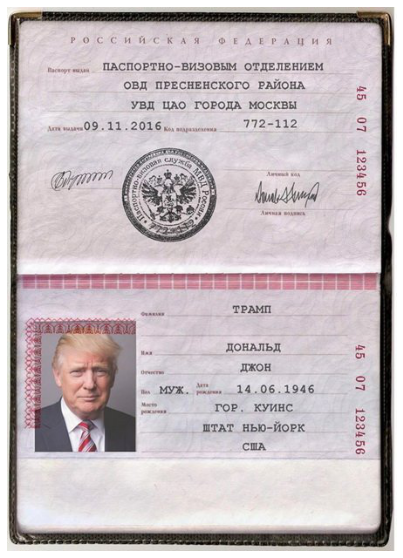

Фамилия:  ТРАМ
Имя:  ДОНАЛЬД
Отчество:  ДКОВ


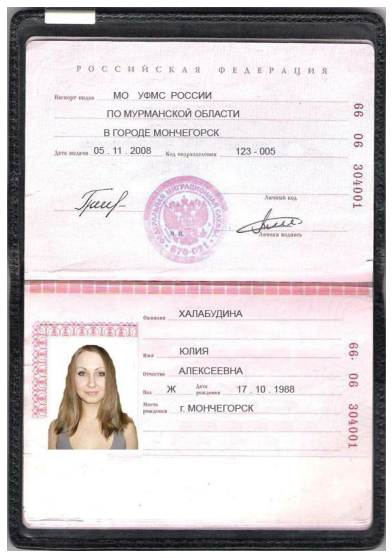

Фамилия:  ХАЛАБУДИНА
Имя:  ЮЛЯ
Отчество:  АЛЕКСЕНЗНА


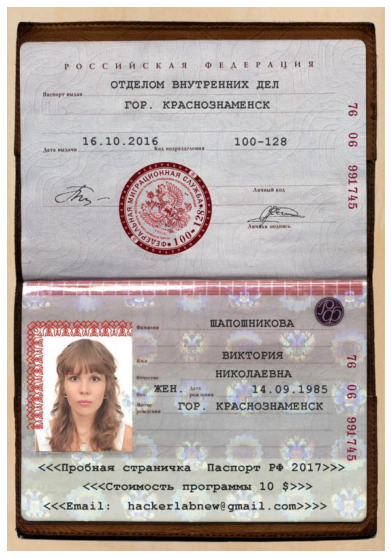

Фамилия:  ШАПОМНИКОВА
Имя:  ВИКТОРИЯ
Отчество:  НИКОЛАЕВНА


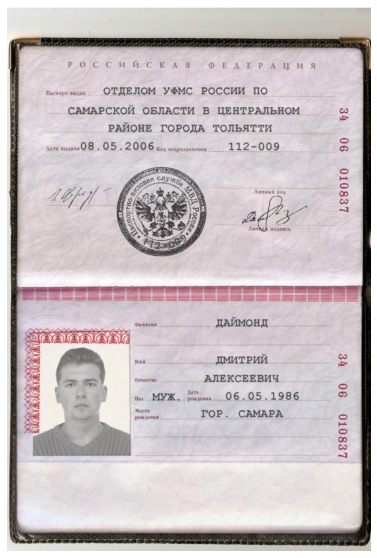

Фамилия:  ДАЙМОНЛ
Имя:  ДМИТРИЙ
Отчество:  АЛЕКСЕВИЧ


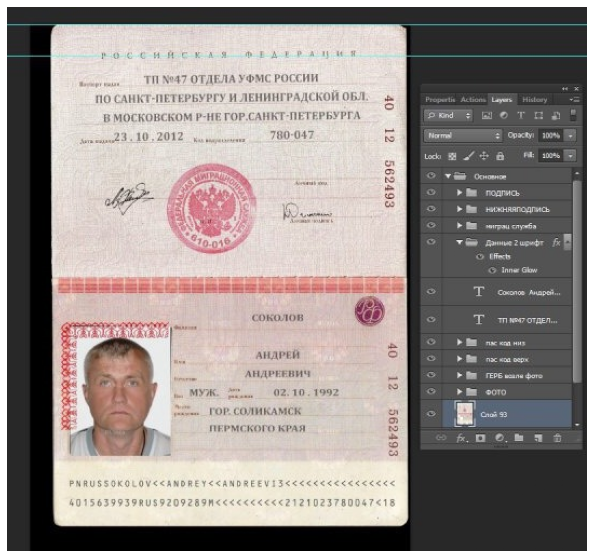

Фамилия:  СОКЛН
Имя:  АНДРЕЙ
Отчество:  АНАРЕЕЙИЧ


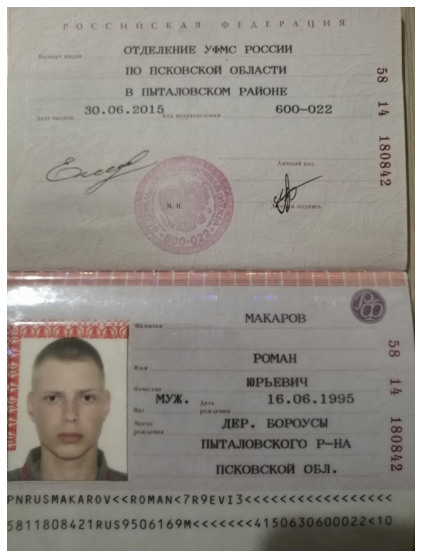

Фамилия:  МАКАРОВ
Имя:  РОМА
Отчество:  ИРЫВИЧ


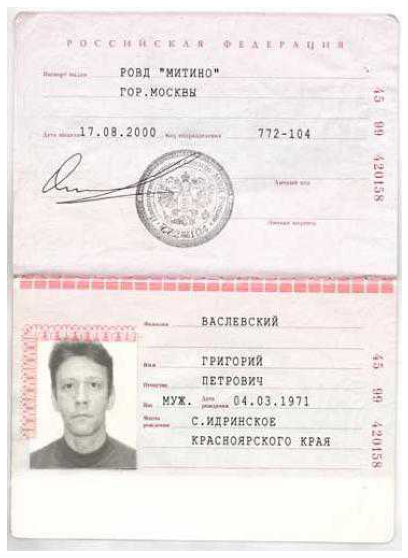

Фамилия:  ЙСЛВСЙ
Имя:  РИПОРЙ
Отчество:  ЕТОВЧ


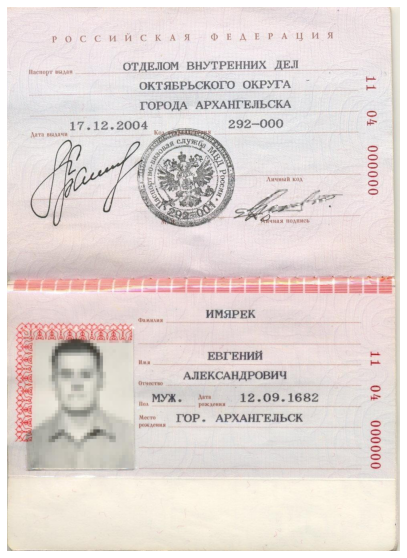

Фамилия:  ИМЯРЕК
Имя:  ЕВГЕНИЙ
Отчество:  АЛЕКСАНДРОВИЧ


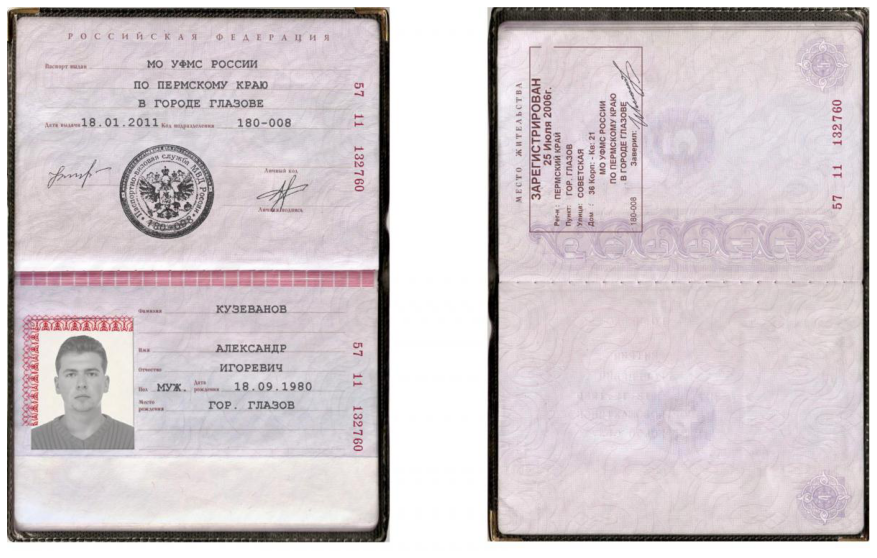

Фамилия:  КУЗЕВАНОВ
Имя:  АЛЕКСАНД
Отчество:  ИГОРЕВИ


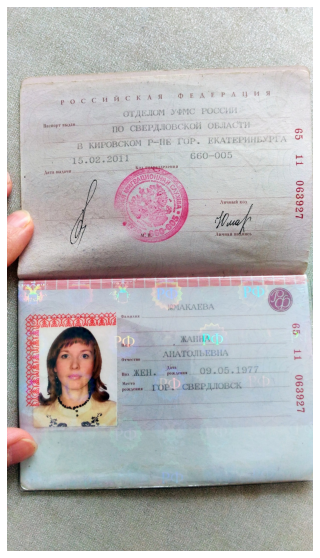

Фамилия:  ЕМАКАЕЗ
Имя:  БАНА
Отчество:  АНАТОЕ


In [ ]:
# Распознаем ФИО с паспортов
legends = ['Фамилия', 'Имя', 'Отчество']
for item in test_files:
  plt.figure(figsize=(16, 10))
  img = mpimg.imread(join(TEST_PATH, item))
  plt.imshow(img)
  plt.axis('off')
  plt.show()
  for i in range(3):
    print(legends[i] + ': ', 
          predict(model, 
                  join('/content/gdrive/MyDrive/P-OCR/sample/', str(i + 1) + '_' + item)))

Качество распознавания ФИО хуже, чем в первых 2 вариантах, однако при этом ФИО четко выделены из другой текстовой информации со сканов паспортов.